<a href="https://colab.research.google.com/github/sebasrosalesr/Sample-projects/blob/main/Dog_vision_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##🐶End-to-End Multi-Class Dog Breed Classification Using TensorFlow and Transfer Learning Model:   

This project involves building an end-to-end multi-class classification model to identify dog breeds using TensorFlow and transfer learning. Below is a summary of the key steps and components involved:

1. Setup and Imports

	•	Import necessary libraries including TensorFlow, TensorFlow Hub, NumPy, Matplotlib, and others.

	•	Mount Google Drive to access and save data.

2. Data Preparation

	•	Load and preprocess the dataset of dog images.

	•	Organize the data into training, validation, and test sets.

	•	Use the ImageDataGenerator to augment the training data.

3. Model Creation

	•	Define the input shape and output shape based on the image size and number of dog breeds.

	•	Use a pre-trained model from TensorFlow Hub (e.g., MobileNetV2) for transfer learning.

	•	Create a new model by adding a Dense layer on top of the pre-trained model for classification.
  

This notebook provides an end-to-end solution for classifying dog breeds using TensorFlow.

	1.	Objective: Identify the dog breed given an image.
	2.	Data: The dataset is sourced from Kaggle’s Dog Breed Identification competition, containing over 200,000 images.
	3.	Evaluation: The evaluation metric is Multi-Class Log Loss, which measures the predicted probability against the observed target.
	4.	Features: The dataset includes images of 120 different dog breeds (multi-class). There are approximately 100,000+ images in the training set and around 10,000+ images in the test set. TensorFlow will be used as the primary library for solving this multi-class problem.




In [ ]:
import tensorflow as tf

In [ ]:
#import lirbraries
import tensorflow_hub as hub
import tensorflow as tf

In [ ]:
print(hub.__version__)

0.16.1


In [ ]:
print(tf.__version__)

2.15.0


In [ ]:
# Try to find a GPU device
device_name = tf.config.list_physical_devices('GPU')

if device_name:
  print("Found GPU at: {}".format(device_name[0]))
else:
  print("No GPU. gato cantando a lo montes.")


Found GPU at: PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


*Turning images into numeric values*

importing all the data and tansforming into numeric values

In [ ]:
import pandas as pd

In [ ]:
label_csv = pd.read_csv('/content/drive/MyDrive/Dog Vision Project Deep Learning/dog-breed-identification/labels.csv')

In [ ]:
print(label_csv.describe())


                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [ ]:
label_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
label_csv.breed.value_counts()

breed
scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: count, Length: 120, dtype: int64

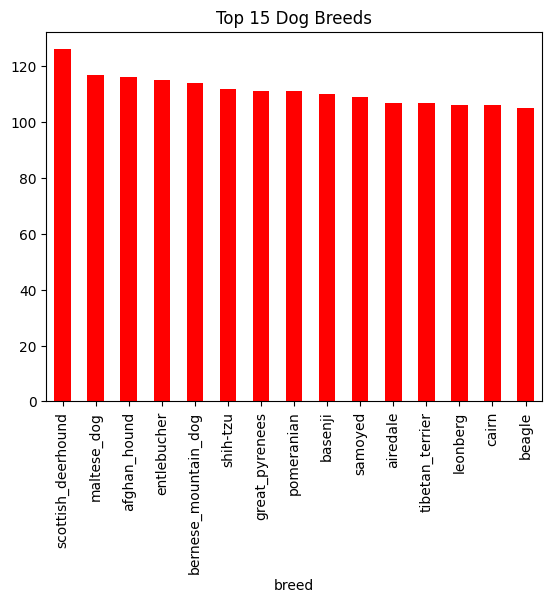

In [ ]:
# prompt: plot the top 15

import matplotlib.pyplot as plt

label_csv.breed.value_counts().head(15).plot(kind='bar', color='Red')
plt.title('Top 15 Dog Breeds')
plt.show()


In [ ]:
## google recomend a minimun images 10 per class
label_csv.breed.value_counts().median()

82.0

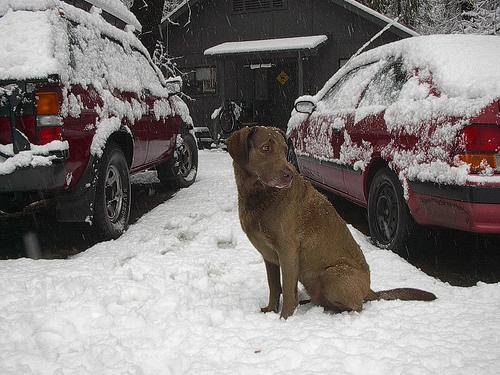

In [ ]:
#Display and import and image
from IPython.display import Image, display

display(Image(filename='/content/drive/MyDrive/Dog Vision Project Deep Learning/dog-breed-identification/train/fff43b07992508bc822f33d8ffd902ae.jpg'))

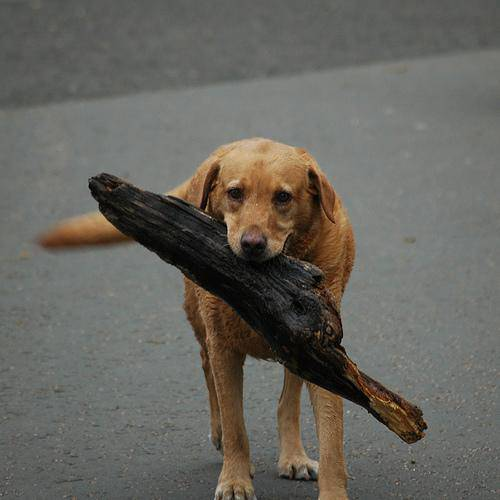

In [ ]:
display(Image(filename='/content/drive/MyDrive/Dog Vision Project Deep Learning/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg'))

In [ ]:
#create a path names for Id's
filenames = ['drive/MyDrive/Dog Vision Project Deep Learning/dog-breed-identification/train/'+fname+'.jpg'for fname in label_csv['id']]
filenames[:5]

['drive/MyDrive/Dog Vision Project Deep Learning/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision Project Deep Learning/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision Project Deep Learning/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision Project Deep Learning/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision Project Deep Learning/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

In [ ]:
# line of code to review that matches the directory created for the filenames in the file location
import os
if len(os.listdir('drive/MyDrive/Dog Vision Project Deep Learning/dog-breed-identification/train/')) == len(filenames):
  print('it matches, proceed')
else:
  print('not match, please review')

it matches, proceed


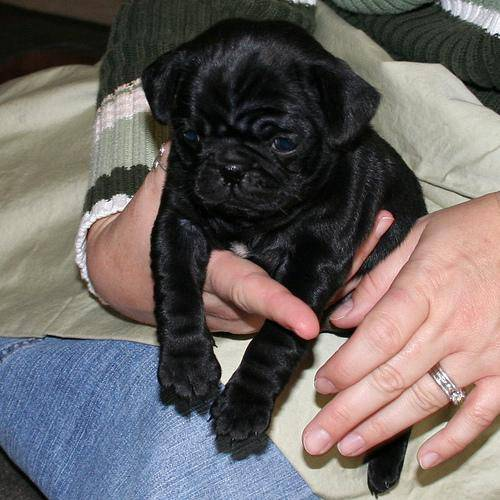

In [ ]:
#checking the filename
Image(filenames[7670])

In [ ]:
label_csv['breed'][7670]

'pug'

In [ ]:
#since we have the filepath in a list, lets prepare the data into numbers
import numpy as np

labels = np.array(label_csv['breed'])
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
if len(labels) == len(filenames):
  print('it matches, proceed')
else:
  print('not match, please review')

it matches, proceed


In [ ]:
#find a unique value names
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
#turn every single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]


[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# example of turning booleans into integers
print(labels[0]) #original label
print(np.where(unique_breeds == labels[0]))  #index where label occurs
print(np.argmax(boolean_labels[0])) #index when a label occurs in a boolean array
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
#Example 2
print(labels[4])
print(np.argmax(boolean_labels[4]))
print(boolean_labels[4].astype(int))

golden_retriever
49
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


 **Creating our validation test since Kaggle did not have it on their data**

In [ ]:
#Set up X and y
X = filenames
y = boolean_labels

In [ ]:
# We are starting off to experiment from 1000 examples to optimize computation time

NUM_IMAGES = 1000 #@param {type: "slider", min:1000, max:10000, step:1000}




In [ ]:
#Setting Training split sets up to num_images variable
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)

len(X_train), len(X_val), len(y_train), len(y_val)


(800, 200, 800, 200)

In [ ]:
#checking the formats
X_train[:2], y_train[:2]


(['drive/MyDrive/Dog Vision Project Deep Learning/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision Project Deep Learning/dog-breed-identification/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, Fa

**Processing images(turning images into tensors)**

In [ ]:
#check the image shape

import matplotlib.pyplot as plt # Changed import alias
import matplotlib.image as mpimg
import numpy as np

image = mpimg.imread(filenames[42]) # Use mpimg to read the image
image.shape

(257, 350, 3)

In [ ]:
#Conver into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

### Function that pre process images and turn into a tensor

In [ ]:
#Define image size
IMG_SIZE = 224


# Create a function to pre process the images
def process_image(image_path, img_size=IMG_SIZE):
  ''' Takes an image file path and turns it into a tensor'''
  image = tf.io.read_file(image_path) # Read the file
  image = tf.image.decode_jpeg(image, channels=3) # Decode the jpeg image
  image = tf.image.convert_image_dtype(image, tf.float32) # Scale the image(NORMALIZATION) = convert color channels from 0 to 255 to 0 and 1
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turn our data into mini-batches

Mini-batches 32 is already standarized

in order to tensor flow to work we need the data in tensor tuples format



In [ ]:
#function to create a tuple of tensors '(image, label)'
def get_image_label(image_path, label):
  ''' Takes an image file path and turns it into a tensor'''
  image = process_image(image_path)
  return image, label

In [ ]:
#Demo of above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
# Creating Batch size and functions for the batches

batch_size = 32

def create_data_batches(x, y=None, batch_size=batch_size, valid_data=False, test_data=False):
  #if a data is test data set, we've probably dont have labels
  if test_data:
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) #only file path, no labels
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch
  elif valid_data:
    print('creating validation data')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y))) #file path and labels
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch
  else:
    print('creating training data')
    #turn file paths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y))) #file path and labels
    #data shuffle
    data = data.shuffle(buffer_size=len(X))
    #create (image, label) tuple (turns the image path into preprocessed image)
    data = data.map(get_image_label)
    #create batches
    data_batch = data.batch(batch_size)
    return data_batch

In [ ]:
#Create a traning and valid data

train_data = create_data_batches(X_train, y_train)
valid_data = create_data_batches(X_val, y_val, valid_data=True)

creating training data
creating validation data


In [ ]:
#check out the different attributes of our data batches
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches


In [ ]:
import matplotlib.pyplot as plt

def show_25_images(images, labels):
  '''
  Displays 25 images from a batch of images and labels
  '''
  plt.figure(figsize=(10, 10))
  #loop thru 25 for 25 images
  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis('off')


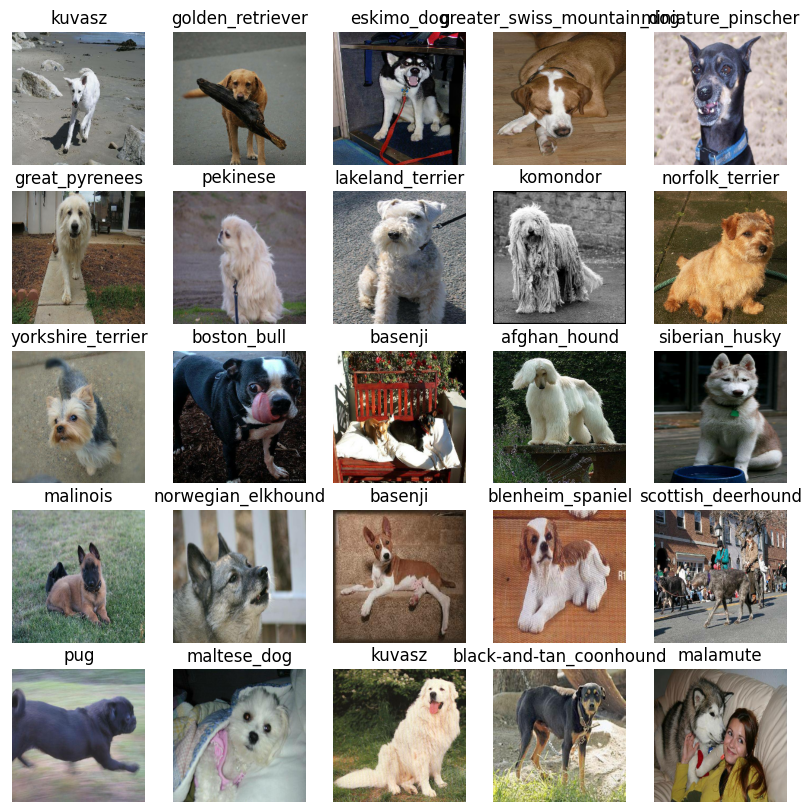

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

In [ ]:
len(train_images), len(train_labels)

(32, 32)

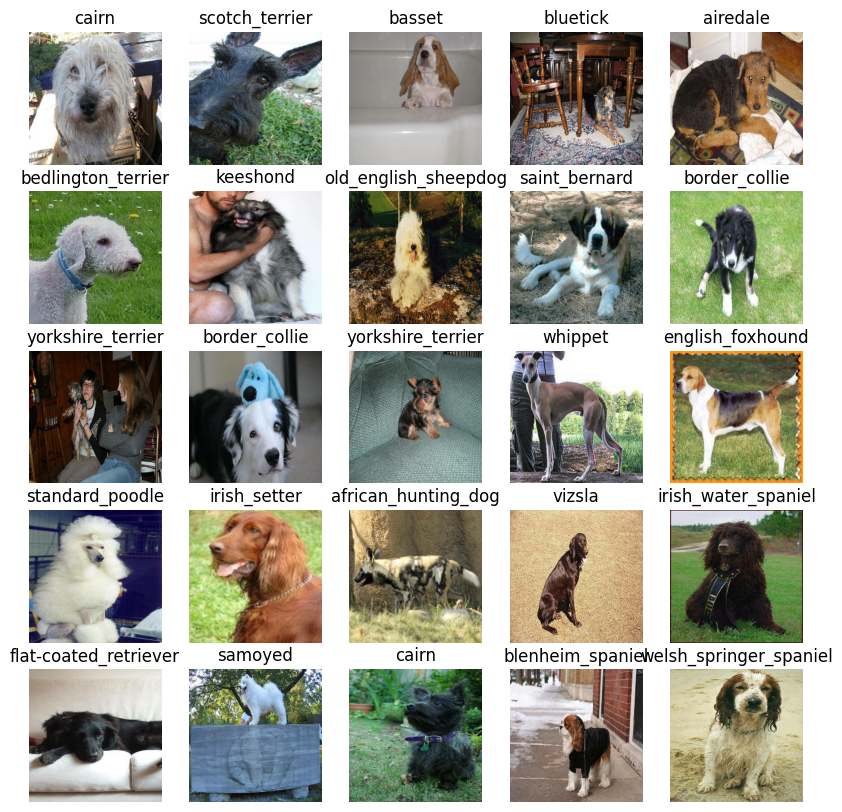

In [ ]:
#Visualizing the validation set
valid_images, valid_labels = next(valid_data.as_numpy_iterator())
show_25_images(valid_images, valid_labels)

## Build a model

Before we build a model using transfer learning, just to remember

1.   input has to be a tensorList item
2.   output
3.   the url of the model

In [ ]:
#Setup the input shape
input_shape = (IMG_SIZE, IMG_SIZE, 3) #batch, height , width, color channels

#Setup the output shape
output_shape = len(unique_breeds)

#find the url of the model in tensor flow
model_url = 'https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/classification/4'

Inoputs and outputs and the model ready to go,



1.   Take the input and the outputo of the model
2.   Defines the layers and the keras model in sequential fashion
3.   Complies the model(say how it should be evaluated and improved)
4.   Builds the model (tell the model the input shape it'll be getting)
5.   Returns the model


In [ ]:

# Define a function to create the model
def create_model(input_shape, output_shape, model_url):
    # Download the model from TensorFlow Hub
    model = tf.keras.Sequential([
        hub.KerasLayer(model_url, input_shape=input_shape), #INPUT
        tf.keras.layers.Dense(units=output_shape, activation='softmax') #OUTPUT
    ])
    # Compile the model
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Create the model
model = create_model(input_shape, output_shape, model_url)

# Print the model summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              3540265   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 3660505 (13.96 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 3540265 (13.51 MB)
_________________________________________________________________


Call backs

	1.	Early Stopping:
	•	Prevent Overfitting: By monitoring a specific metric (e.g., validation loss), you can stop training when the performance on the validation set stops improving. This prevents overfitting and saves computational resources.
	•	Patience Parameter: The early stopping callback can use a patience parameter to continue training for a few more epochs after the last improvement, allowing the model a chance to find a better optimum.

  2, Tensorboard
  •	Progress Monitoring: Callbacks can be used to monitor the progress of the training process. For instance, you can log the loss and accuracy at the end of each epoch to visualize the learning curve.
	•	Logging: You can log metrics to a file or a service (like TensorBoard) to keep track of the model’s performance over time.

In [ ]:
# Load tensorflow notebook extension
%load_ext tensorboard

In [ ]:
# create callbacks
# second call back is for tensorborad
import datetime
import os
# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
    # Create a log directory for storing TensorBoard logs
    logdir = os.path.join("drive/MyDrive/Dog Vision Project Deep Learning/dog-breed-identification/logs",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    # Return the TensorBoard callback
    return tf.keras.callbacks.TensorBoard(log_dir=logdir)
#Early stop to avoid overfitting
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3)

## Training a modelew Section (on subset of the data)

our first model is going to be trained a 1000, to make sure evrything is working



In [ ]:
#num of epochs
NUM_EPOCHS = 100 #@param{type: 'slider' ,min:10, max:100, step:10}


In [ ]:
# Try to find a GPU device
device_name = tf.config.list_physical_devices('GPU')

if device_name:
  print("Found GPU at: {}".format(device_name[0]))
else:
  print("No GPU. gato cantando a lo montes.")

Found GPU at: PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [ ]:
#Build a funcion that train and return a trained model:
def train_model():
  '''
  Train a model and return a trained model
  '''
  #Create a model
  model = create_model(input_shape, output_shape, model_url)
  #Create a tensorboard callback
  tensorboard = create_tensorboard_callback()
  #Fit the model to the data passing it
  history = model.fit(train_data,
                      epochs=NUM_EPOCHS,
                      validation_data=valid_data,
                      validation_freq=1,
                      callbacks=[tensorboard, early_stopping])
  #return fitted model
  return model

In [ ]:
model = train_model() #train the model

Epoch 1/100
25/25 [==============================] - 125s 3s/step - loss: 4.5600 - accuracy: 0.1100 - val_loss: 3.3146 - val_accuracy: 0.2750
Epoch 2/100
25/25 [==============================] - 2s 72ms/step - loss: 1.5537 - accuracy: 0.6963 - val_loss: 2.0684 - val_accuracy: 0.5000
Epoch 3/100
25/25 [==============================] - 2s 71ms/step - loss: 0.5028 - accuracy: 0.9388 - val_loss: 1.6138 - val_accuracy: 0.6200
Epoch 4/100
25/25 [==============================] - 2s 72ms/step - loss: 0.2277 - accuracy: 0.9912 - val_loss: 1.4749 - val_accuracy: 0.6700
Epoch 5/100
25/25 [==============================] - 2s 76ms/step - loss: 0.1308 - accuracy: 0.9962 - val_loss: 1.4164 - val_accuracy: 0.6750
Epoch 6/100
25/25 [==============================] - 2s 73ms/step - loss: 0.0904 - accuracy: 1.0000 - val_loss: 1.3744 - val_accuracy: 0.6750
Epoch 7/100
25/25 [==============================] - 2s 72ms/step - loss: 0.0678 - accuracy: 1.0000 - val_loss: 1.3482 - val_accuracy: 0.6650
Epoch 

In [ ]:
#Models is overfitted in the training set reaching a 100% accuracy

#checking the tensorboard logs

%tensorboard --logdir drive/MyDrive/Dog\ Vision\ Project\ Deep\ Learning/dog-breed-identification/logs

<IPython.core.display.Javascript object>

### **Making evaluation prediction using a trained model:**

In [ ]:
#making prediction on the validation data

predictions = model.predict(valid_data, verbose =1)
predictions



7/7 [==============================] - 1s 51ms/step


array([[3.29531543e-03, 4.30423766e-03, 3.34961660e-04, ...,
        1.19177473e-03, 1.54727045e-03, 3.72492406e-03],
       [5.92625991e-04, 8.48521572e-03, 1.00222565e-02, ...,
        1.55377769e-04, 1.25584090e-02, 1.19496563e-05],
       [3.45840745e-05, 4.50771986e-05, 7.18579904e-05, ...,
        1.76775269e-04, 1.43761834e-04, 1.18256621e-02],
       ...,
       [2.95441041e-05, 1.47555293e-05, 1.11263798e-05, ...,
        7.98662077e-05, 1.05726154e-04, 2.93292924e-05],
       [9.46745349e-05, 4.18913842e-05, 4.12513255e-05, ...,
        6.15604631e-06, 6.21560830e-05, 1.83679876e-04],
       [3.14225996e-04, 6.13037628e-05, 4.98936104e-04, ...,
        2.18419936e-02, 7.89934595e-04, 3.73520190e-03]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
#First predictions
index = 42
print(predictions[0])
print(f'Max value(confidence level): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Label: {unique_breeds[np.argmax(predictions[index])]}')

[3.29531543e-03 4.30423766e-03 3.34961660e-04 1.33143237e-03
 8.95670801e-03 1.20601791e-03 1.72891691e-02 1.03785738e-03
 7.63765769e-04 2.03771540e-03 4.56123002e-04 7.38481758e-04
 8.37311556e-04 7.38110335e-04 2.37252498e-05 5.57233626e-03
 8.52275043e-05 5.65839708e-02 7.42254924e-05 5.47386706e-04
 8.71291663e-03 6.87215477e-04 3.88924556e-04 1.01372751e-03
 3.73197909e-05 1.06780289e-03 5.01783565e-02 1.64976227e-04
 8.61155335e-04 2.02929671e-03 5.59906075e-05 3.21693579e-03
 1.64978905e-04 3.57921468e-04 6.01239502e-04 2.76180450e-02
 1.12036229e-04 8.94614786e-04 2.94774713e-04 1.84165523e-03
 2.91481684e-03 1.07299165e-04 1.78478498e-04 9.45102016e-04
 5.92203811e-04 8.77662795e-04 6.96172647e-05 7.28769111e-04
 9.33909963e-04 4.44759615e-04 7.39959069e-05 3.23556276e-04
 3.13901878e-03 2.82115652e-04 2.27718454e-04 6.28024136e-05
 1.79093826e-04 1.89822298e-02 2.34201155e-03 2.87348814e-02
 4.45715012e-03 4.45455109e-04 4.89480281e-03 7.40139047e-04
 4.01533500e-04 8.370184

## Time to scale and validate it, using visual component to compare the result with the validation label set

In [ ]:
def get_pred_label(prediction_probabilities):
  '''
  Turns an array of prediction probabilities into a label
  '''
  return unique_breeds[np.argmax(prediction_probabilities)]

#get predicted labels based on array of prediction probabilities
pred_label = get_pred_label(predictions[4])
pred_label

'airedale'

In [ ]:
valid_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Since the validation data set in a batch data set,
it's necesary to unbatchify to make prediction in the validation set and compare it to the true labels(compare it to the validation labels)

In [ ]:
#Create an function to unbatch a data set
def unbatchify(data):
  '''
  Takes a batched(images and labels)Tensors data
  set and returns a seprate array of images and
  array of labels
  '''
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(label)
  return images, labels

#testing unbatchify
valid_images, valid_labels = unbatchify(valid_data)
valid_images[0], valid_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(valid_labels[0])

'cairn'

## Create a char to visualize the predict values compared to the real labels

In [ ]:
def plot_preds(prediction_probabilities, labels, images, n=1):
    ''' View the prediction, ground truth and images for sample n '''
    pred_label = get_pred_label(prediction_probabilities[n])
    true_label = unique_breeds[labels[n].argmax()]
    plt.imshow(images[n])
    if pred_label == true_label:
        color = 'green'
    else:
        color = 'red'
    confidence = np.max(prediction_probabilities[n]) * 100
    plt.title(f"Pred: {pred_label} | True: {true_label} | Confidence: {confidence:.2f}%", color=color)
    plt.axis(False)

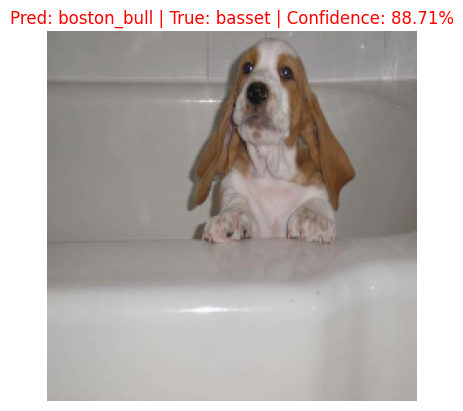

In [ ]:
plot_preds(predictions, valid_labels, valid_images,n=2)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
    """
    Plots the top 10 highest prediction confidences along with the truth label for sample n.
    """
    pred_prob, true_label = prediction_probabilities[n], labels[n]

    # Get the predicted label
    pred_label = get_pred_label(pred_prob)
    true_label_name = unique_breeds[true_label.argmax()]

    # Find the top 10 prediction confidence indexes
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
    # Find the top 10 prediction confidence values
    top_10_pred_values = pred_prob[top_10_pred_indexes]
    # Find the top 10 prediction labels
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]

    # Setup plot
    top_plot = plt.bar(range(len(top_10_pred_values)), top_10_pred_values, color='blue')
    plt.xticks(range(len(top_10_pred_labels)), top_10_pred_labels, rotation='vertical')

    # Change color of true label
    for i, patch in enumerate(top_plot):
        if top_10_pred_labels[i] == true_label_name:
            patch.set_color('green')

    print(f"True label: {true_label_name}")
    print(f"Predicted label: {pred_label}")
    print(f"Prediction confidence: {np.max(pred_prob) * 100:.2f}%")
    plt.show()

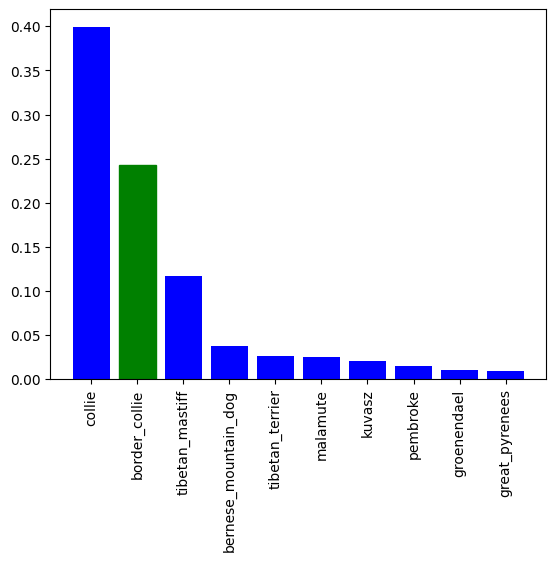

In [ ]:
plot_pred_conf(predictions, valid_labels, n=9)

In [ ]:
# Combined plot with predicted bars and predicted image
def plot_combined(prediction_probabilities, labels, images, n=1):
    ''' View the prediction, ground truth and images for sample n along with top 10 prediction confidences. '''
    # Get the predicted label
    pred_label = get_pred_label(prediction_probabilities[n])
    true_label = unique_breeds[labels[n].argmax()]

    # Plot the image
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(images[n])
    if pred_label == true_label:
        color = 'green'
    else:
        color = 'red'
    confidence = np.max(prediction_probabilities[n]) * 100
    plt.title(f"Pred: {pred_label} | True: {true_label} | Confidence: {confidence:.2f}%", color=color)
    plt.axis('off')

    # Plot the top 10 prediction confidences
    plt.subplot(1, 2, 2)
    pred_prob = prediction_probabilities[n]

    # Find the top 10 prediction confidence indexes
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
    # Find the top 10 prediction confidence values
    top_10_pred_values = pred_prob[top_10_pred_indexes]
    # Find the top 10 prediction labels
    top_10_pred_labels = [unique_breeds[i] for i in top_10_pred_indexes]

    # Setup plot
    top_plot = plt.bar(range(len(top_10_pred_values)), top_10_pred_values, color='blue')
    plt.xticks(range(len(top_10_pred_labels)), top_10_pred_labels, rotation='vertical')

    # Change color of true label
    for i, patch in enumerate(top_plot):
        if top_10_pred_labels[i] == true_label:
            patch.set_color('green')

    plt.title('Top 10 Prediction Confidences')
    plt.show()

# Example usage
# Assuming `predictions`, `valid_labels`, and `valid_images` are defined
plot_combined(predictions, valid_labels, valid_images, n=1)

## Training the full model using the training set with no validation set

In [ ]:
#Create data batches with full data set

full_data = create_data_batches(X, y, batch_size=32)

creating training data


In [ ]:
full_data, len(X), len(y)

(<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>,
 10222,
 10222)

In [ ]:
#Training model on the full set

full_model = create_model(input_shape, output_shape, model_url)

In [ ]:
#create a model full tensor board
full_tensorboard = create_tensorboard_callback()
full_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=3)


In [ ]:
#fit the model to the full data
full_model.fit(x=full_data,
              epochs=NUM_EPOCHS,
              callbacks=[full_tensorboard, full_early_stopping])

Epoch 1/100
320/320 [==============================] - 18s 55ms/step - loss: 0.0113 - accuracy: 0.9986
Epoch 2/100
320/320 [==============================] - 18s 57ms/step - loss: 0.0102 - accuracy: 0.9986
Epoch 3/100
320/320 [==============================] - 18s 55ms/step - loss: 0.0065 - accuracy: 0.9991
Epoch 4/100
320/320 [==============================] - 18s 55ms/step - loss: 0.0085 - accuracy: 0.9989
Epoch 5/100
320/320 [==============================] - 18s 55ms/step - loss: 0.0061 - accuracy: 0.9992
Epoch 6/100
320/320 [==============================] - 18s 55ms/step - loss: 0.0108 - accuracy: 0.9987
Epoch 7/100
320/320 [==============================] - 18s 57ms/step - loss: 0.0094 - accuracy: 0.9977
Epoch 8/100
320/320 [==============================] - 18s 57ms/step - loss: 0.0340 - accuracy: 0.9914


In [ ]:
import numpy as np
from tensorflow.keras.preprocessing import image
import os

# Function to preprocess the image
def preprocess_image(img_path, target_size):
    try:
        img = image.load_img(img_path, target_size=target_size)
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array /= 255.0  # Normalize the image
        return img_array
    except Exception as e:
        print(f"Error loading image {img_path}: {e}")
        return None

# Path to the directory containing custom images
custom_images_dir = '/content/drive/MyDrive/Dog Vision Project Deep Learning/dog-breed-identification/custom'

# List of image file paths
custom_image_paths = [os.path.join(custom_images_dir, img_name) for img_name in os.listdir(custom_images_dir) if img_name.endswith(('.jpg', '.jpeg', '.png'))]

# Load and preprocess the images
preprocessed_images = []
valid_image_paths = []
for img_path in custom_image_paths:
    img_array = preprocess_image(img_path, target_size=(224, 224))  # Adjust target_size as needed
    if img_array is not None:
        preprocessed_images.append(img_array)
        valid_image_paths.append(img_path)

if preprocessed_images:
    preprocessed_images = np.vstack(preprocessed_images)
else:
    print("No valid images to predict.")

In [ ]:
# Make predictions if we have preprocessed images
if len(preprocessed_images) > 0:
    predictions = loaded_model.predict(preprocessed_images)

    # Assuming you have class labels
    class_labels = unique_breeds  # This should be a list of your class labels

    predicted_labels = [class_labels[np.argmax(pred)] for pred in predictions]
    for i, img_path in enumerate(valid_image_paths):
        print(f"Predictions for {img_path}: {predicted_labels[i]} (Probabilities: {predictions[i]})")
else:
    print("No images were processed for prediction.")

1/1 [==============================] - 0s 24ms/step
Predictions for /content/drive/MyDrive/Dog Vision Project Deep Learning/dog-breed-identification/custom/IMG_2102.jpg: malamute (Probabilities: [7.60104172e-07 6.47917091e-07 3.29545453e-11 6.43675230e-06
 1.68398281e-10 8.39948552e-05 5.34493871e-08 1.01106561e-05
 2.64905586e-09 3.67200278e-06 8.17698856e-06 2.13388426e-04
 2.04297707e-11 9.50290239e-04 7.25268379e-08 6.96955880e-08
 3.43327656e-07 3.69107767e-08 5.66413437e-05 3.56630298e-05
 3.33592141e-08 4.21958823e-09 9.76645209e-10 8.47212214e-05
 8.88446174e-12 1.01853970e-09 1.27100419e-09 2.64387609e-06
 5.56440465e-03 2.07271867e-07 4.40210461e-05 2.13466773e-08
 7.32227054e-04 1.40808494e-08 2.02476016e-07 2.51824890e-08
 8.20917889e-10 1.52311230e-03 2.43008998e-07 1.42392251e-04
 1.65176857e-07 1.04575940e-06 3.91911186e-07 2.77429604e-06
 1.06601193e-10 4.39848336e-05 5.32430455e-08 1.04122705e-07
 9.00277598e-07 6.36908342e-04 1.60622207e-07 6.27548999e-08
 1.33891788e

1/1 [==============================] - 1s 845ms/step


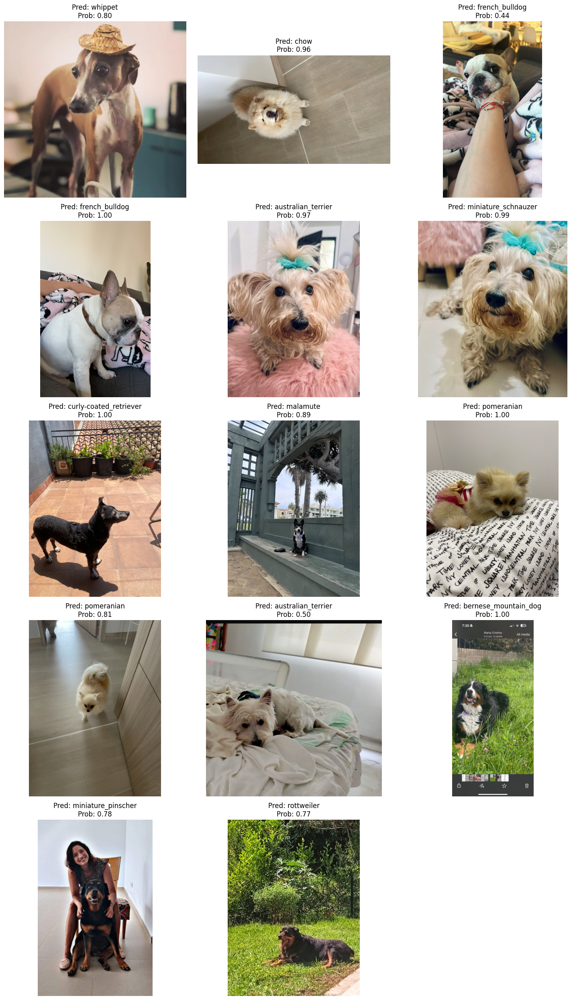

In [ ]:
from tensorflow.keras.preprocessing import image
import os
import math

# Function to preprocess the image
def preprocess_image(img_path, target_size):
    try:
        img = image.load_img(img_path, target_size=target_size)
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array /= 255.0  # Normalize the image
        return img_array
    except Exception as e:
        print(f"Error loading image {img_path}: {e}")
        return None

# Path to the directory containing custom images
custom_images_dir = '/content/drive/MyDrive/Dog Vision Project Deep Learning/dog-breed-identification/custom'

# List of image file paths
custom_image_paths = [os.path.join(custom_images_dir, img_name) for img_name in os.listdir(custom_images_dir) if img_name.endswith(('.jpg', '.jpeg', '.png', '.JPG', '.JPEG', '.PNG'))]

# Load and preprocess the images
preprocessed_images = []
valid_image_paths = []
for img_path in custom_image_paths:
    img_array = preprocess_image(img_path, target_size=(224, 224))  # Adjust target_size as needed
    if img_array is not None:
        preprocessed_images.append(img_array)
        valid_image_paths.append(img_path)

if preprocessed_images:
    preprocessed_images = np.vstack(preprocessed_images)
else:
    print("No valid images to predict.")

# Make predictions if we have preprocessed images
if len(preprocessed_images) > 0:
    predictions = loaded_model.predict(preprocessed_images)

    # Assuming you have class labels
    class_labels = unique_breeds  # This should be a list of your class labels

    predicted_labels = [class_labels[np.argmax(pred)] for pred in predictions]

    # Calculate the grid size
    num_images = len(valid_image_paths)
    num_cols = 3
    num_rows = math.ceil(num_images / num_cols)

    # Plot the images along with predictions
    plt.figure(figsize=(15, 5 * num_rows))
    for i, img_path in enumerate(valid_image_paths):
        plt.subplot(num_rows, num_cols, i + 1)
        img = image.load_img(img_path)
        plt.imshow(img)
        plt.title(f"Pred: {predicted_labels[i]}\nProb: {np.max(predictions[i]):.2f}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()
else:
    print("No images were processed for prediction.")

In [ ]:
# Save the trained model to a file in the recommended format
model_path = '/content/drive/MyDrive/Dog Vision Project Deep Learning/dog-breed-identification/models/full_trained_model.keras'
full_model.save(model_path)

print(f"Model saved to '{model_path}'")

Model saved to '/content/drive/MyDrive/Dog Vision Project Deep Learning/dog-breed-identification/models/full_trained_model.keras'


In [ ]:
# libraries to load the model
from tensorflow.keras.models import load_model
import tensorflow_hub as hub

model_path = '/content/drive/MyDrive/Dog Vision Project Deep Learning/dog-breed-identification/models/full_trained_model.keras'

# Load the model
loaded_model = load_model(model_path, custom_objects={'KerasLayer': hub.KerasLayer})

# Print the model summary
loaded_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_2 (KerasLayer)  (None, 1001)              3540265   
                                                                 
 dense_2 (Dense)             (None, 120)               120240    
                                                                 
Total params: 3660505 (13.96 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 3540265 (13.51 MB)
_________________________________________________________________
